<a href="https://colab.research.google.com/github/BONNIEVITTOALZAIN/AI-Capstone-DC/blob/master/notebooks/blur_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
!rm -rf blur-dataset.zip
!rm -rf blur-dataset
!rm -rf images

In [31]:
from google.colab import files

from datetime import datetime
import time
import shutil
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split

import tensorflow as tf
import keras
from keras.layers import Dense, BatchNormalization, GlobalAveragePooling2D, Dropout, Conv2D, Input, TFSMLayer
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input
from tensorflow.keras import layers
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.callbacks import Callback, TensorBoard
from tensorflow.keras.metrics import SparseCategoricalAccuracy, Mean

In [32]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [33]:
log_dir = "logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
!rm -rf ./logs/
tf.summary.create_file_writer("./logs/")

In [34]:
!kaggle datasets download kwentar/blur-dataset
!unzip blur-dataset.zip -d blur-dataset

Dataset URL: https://www.kaggle.com/datasets/kwentar/blur-dataset
License(s): CC0-1.0
100% 1.49G/1.49G [00:08<00:00, 191MB/s]

Archive:  blur-dataset.zip
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/0_IPHONE-SE_F.JPG  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/100_NIKON-D3400-35MM_F.JPG  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/101_NIKON-D3400-35MM_F.JPG  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/102_NIKON-D3400-35MM_F.JPG  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/103_HUAWEI-P20_F.jpg  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/104_IPHONE-SE_F.jpg  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/105_IPHONE-SE_F.jpg  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/106_NIKON-D3400-35MM_F.JPG  
  inflating: blur-dataset/blur_dataset_scaled/defocused_blurred/107_XIAOMI-MI8-SE_F.jpg  
  inflating: blur-dataset/blur_dataset_sc

In [35]:
unsplitted_dataset_dir = 'unsplitted-dataset'
src_dir = 'blur-dataset'

for dir in os.listdir(src_dir):
  if dir == 'blur_dataset_scaled':
    continue

  if not os.path.exists(f'{unsplitted_dataset_dir}/{dir}'):
    os.makedirs(f'{unsplitted_dataset_dir}/{dir}')

  for file in os.listdir(f'{src_dir}/{dir}'):
    shutil.copyfile(f'{src_dir}/{dir}/{file}', f'{unsplitted_dataset_dir}/{dir}/{file}')

In [36]:
full_path = []
file_name = []
labels = []

for dir in os.listdir(unsplitted_dataset_dir):
  for file in os.listdir(f'{unsplitted_dataset_dir}/{dir}'):
    full_path.append(f'{unsplitted_dataset_dir}/{dir}/{file}')
    file_name.append(file)
    labels.append(dir)

df = {
    'full_path': full_path,
    'file_name': file_name,
    'label': labels
}

df = pd.DataFrame(df)
df.head()

,full_path,file_name,label
0,unsplitted-dataset/motion_blurred/53_NIKON-D34...,53_NIKON-D3400-35MM_M.JPG,motion_blurred
1,unsplitted-dataset/motion_blurred/273_NIKON-D3...,273_NIKON-D3400-18-55MM_M.JPG,motion_blurred
2,unsplitted-dataset/motion_blurred/122_HONOR-7X...,122_HONOR-7X_M.jpg,motion_blurred
3,unsplitted-dataset/motion_blurred/263_XIAOMI-R...,263_XIAOMI-REDMI-3S_M.jpg,motion_blurred
4,unsplitted-dataset/motion_blurred/218_IPHONE-S...,218_IPHONE-SE_M.jpg,motion_blurred


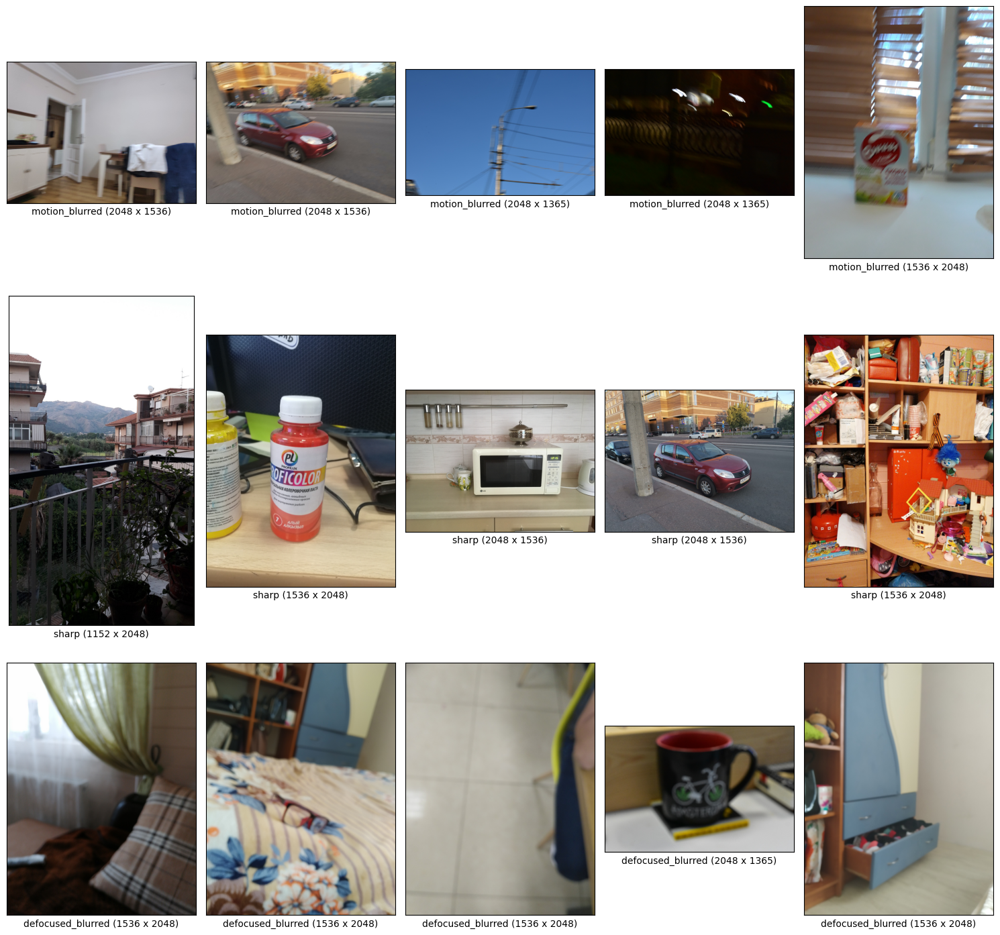

In [37]:
label_set = set(labels)
label_set = sorted(label_set)

rows = len(label_set)
cols = 5

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))

for i, label in enumerate(os.listdir(unsplitted_dataset_dir)):
  images = np.array(df[df['label'] == label].sample(n=cols)['full_path'])

  for j, img_path in enumerate(images):
    image = Image.open(img_path)
    w, h = image.size
    axes[i, j].imshow(image)
    axes[i, j].set(xlabel=f'{label} ({w} x {h})', xticks=[], yticks=[])

fig.tight_layout()

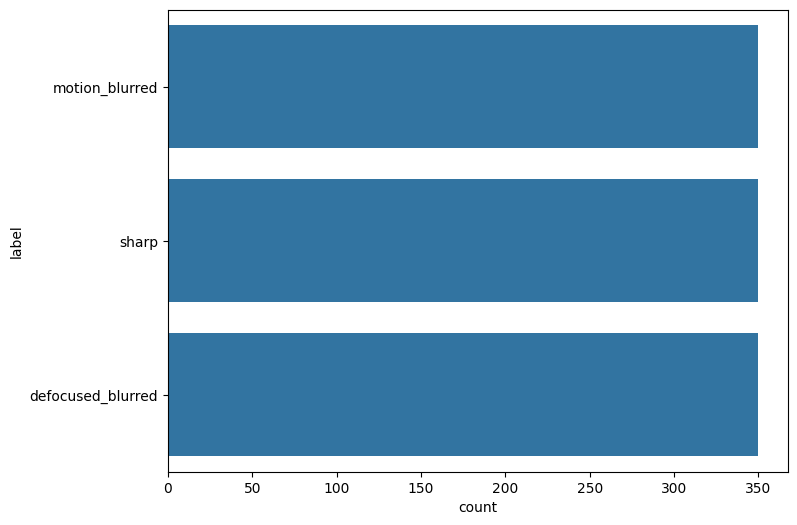

In [38]:
plt.figure(figsize=(8, 6))
plot_data = sns.countplot(df['label'])

In [39]:
X = df['full_path']
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
df_tr = {
    'full_path': X_train,
    'label': y_train,
    'set': 'train'
}

df_tr = pd.DataFrame(df_tr)

df_te = {
    'full_path': X_test,
    'label': y_test,
    'set': 'test'
}

df_te = pd.DataFrame(df_te)

df_all = pd.concat([df_tr, df_te], ignore_index=True)

In [41]:
splitted_dataset_dir = 'dataset-splitted'

for idx, row in df_all.iterrows():
  if not os.path.exists(f'{splitted_dataset_dir}/{row["set"]}/{row["label"]}'):
    os.makedirs(f'{splitted_dataset_dir}/{row["set"]}/{row["label"]}')

  splitted_path = row['full_path'].split('/')
  dst = f'{splitted_dataset_dir}/{row["set"]}/{row["label"]}/{splitted_path[-1]}'
  src = row['full_path']
  shutil.copyfile(src, dst)

In [42]:
TRAIN_DIR = f'{splitted_dataset_dir}/train'
TEST_DIR = f'{splitted_dataset_dir}/test'

INPUT_SIZE = (224, 224, 3)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
  TRAIN_DIR,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(INPUT_SIZE[0], INPUT_SIZE[1]),
  batch_size=BATCH_SIZE
)

val_ds = tf.keras.utils.image_dataset_from_directory(
  TRAIN_DIR,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(INPUT_SIZE[0], INPUT_SIZE[1]),
  batch_size=BATCH_SIZE
)

test_ds = tf.keras.utils.image_dataset_from_directory(
  TEST_DIR,
  image_size=(INPUT_SIZE[0], INPUT_SIZE[1]),
  batch_size=BATCH_SIZE,
  shuffle=False
)

Found 840 files belonging to 3 classes.
Using 672 files for training.
Found 840 files belonging to 3 classes.
Using 168 files for validation.
Found 210 files belonging to 3 classes.


In [43]:
def preprocess(image, label):
  image = preprocess_input(image)
  return image, label

train_ds = train_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)

In [44]:
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds   = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds  = test_ds.prefetch(tf.data.AUTOTUNE)

In [45]:
class CustomLRScheduler(Callback):
  def __init__(self, factor=0.5, patience=5, min_lr=1e-6, max_lr=1e-3):
    super(CustomLRScheduler, self).__init__()
    self.factor = factor
    self.patience = patience
    self.min_lr = min_lr
    self.max_lr = max_lr
    self.wait = 0
    self.best_loss = float('inf')

  def on_epoch_end(self, epoch, logs=None):
    current_loss = logs.get("val_loss")
    lr = tf.keras.backend.get_value(self.model.optimizer.learning_rate)

    if current_loss < self.best_loss:
      self.best_loss = current_loss
      self.wait = 0
    else:
      self.wait += 1
      if self.wait == self.patience:
          new_lr = max(lr * self.factor, self.min_lr)
          self.model.optimizer.learning_rate.assign(new_lr)
          self.wait = 0
          print(f"Reducing learning rate to {new_lr}")

In [46]:
class CustomEarlyStopping(Callback):
  def __init__(self, patience=5):
    super(CustomEarlyStopping, self).__init__()
    self.patience = patience
    self.wait = 0
    self.best_loss = float('inf')
    self.stop = False

  def on_epoch_end(self, epoch, logs=None):
    current_loss = logs.get("val_loss")

    if current_loss < self.best_loss:
      self.best_loss = current_loss
      self.wait = 0
    else:
      self.wait += 1
      if self.wait == self.patience:
        self.stop = True
        print(f'Early stop on epoch {epoch}')

In [47]:
optimizer = Adam(learning_rate=1e-4)
callbacks = [CustomLRScheduler(), CustomEarlyStopping(patience=3)]

loss_object = SparseCategoricalCrossentropy()

train_loss_metric = Mean(name='train_loss')
train_accuracy_metric = SparseCategoricalAccuracy(name='train_accuracy')

val_loss_metric = Mean(name='val_loss')
val_accuracy_metric = SparseCategoricalAccuracy(name='val_accuracy')

test_accuracy_metric = SparseCategoricalAccuracy(name='test_accuracy')

In [48]:
base_model = EfficientNetV2B0(
    include_top=False,
    weights='imagenet',
    input_shape=INPUT_SIZE
)

base_model.trainable = True

inputs = Input(shape=INPUT_SIZE)
x = base_model(inputs, training=False)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = GlobalAveragePooling2D()(x)
x = Dense(32, activation='relu', kernel_regularizer='l2')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(len(label_set), activation='softmax')(x)

cnn = keras.Model(inputs, outputs)

In [49]:
@tf.function
def train_step(images, labels):
  with tf.GradientTape() as tape:
    predictions = cnn(images, training=True)
    loss = loss_object(labels, predictions)

  gradients = tape.gradient(loss, cnn.trainable_variables)
  optimizer.apply_gradients(zip(gradients, cnn.trainable_variables))

  train_loss_metric.update_state(loss)
  train_accuracy_metric.update_state(labels, predictions)

@tf.function
def val_step(images, labels):
  predictions = cnn(images, training=False)
  loss = loss_object(labels, predictions)

  val_loss_metric.update_state(loss)
  val_accuracy_metric.update_state(labels, predictions)

@tf.function
def test_step(images, labels):
  predictions = cnn(images, training=False)

  test_accuracy_metric.update_state(labels, predictions)

def evaluate(model, test_ds):
  test_accuracy_metric.reset_state()

  for images, labels in test_ds:
    test_step(images, labels)

  return test_accuracy_metric.result()

In [50]:
train_writer = tf.summary.create_file_writer(log_dir + "/train")
val_writer = tf.summary.create_file_writer(log_dir + "/val")

In [51]:
def train_model(model, train_ds, val_ds, epochs, callbacks=[]):
  for epoch in range(epochs):
    start = time.time()

    print(f"\nEpoch {epoch+1}/{epochs}")

    train_loss_metric.reset_state()
    train_accuracy_metric.reset_state()
    val_loss_metric.reset_state()
    val_accuracy_metric.reset_state()

    for images, labels in train_ds:
      train_step(images, labels)

    for val_images, val_labels in val_ds:
      val_step(val_images, val_labels)

    end = time.time()

    diff_time = end - start

    train_acc = train_accuracy_metric.result()
    val_acc = val_accuracy_metric.result()
    train_loss = train_loss_metric.result()
    val_loss = val_loss_metric.result()

    print(f'[{diff_time:.2f}s] Train Accuracy: {(train_acc * 100):.4f}% - Train Loss: {train_loss:.4f} - Val Accuracy: {(val_acc * 100):.4f}% - Val Loss: {val_loss:.4f}')

    with train_writer.as_default():
      tf.summary.scalar("loss", train_loss, step=epoch)
      tf.summary.scalar("accuracy", train_acc, step=epoch)

    with val_writer.as_default():
      tf.summary.scalar("loss", val_loss, step=epoch)
      tf.summary.scalar("accuracy", val_acc, step=epoch)

    stop_training = False
    for callback in callbacks:
      callback.on_epoch_end(epoch, logs={
        'train_loss': train_loss,
        'train_accuracy': train_acc,
        'val_loss': val_loss,
        'val_accuracy': val_acc
      })

      if getattr(callback, 'stop'):
        stop_training = True
        break

    if stop_training:
      break


In [52]:
train_model(cnn, train_ds, val_ds, epochs=15)


Epoch 1/15
[91.27s] Train Accuracy: 48.3631% - Train Loss: 1.3650 - Val Accuracy: 57.1429% - Val Loss: 0.9142

Epoch 2/15
[15.86s] Train Accuracy: 74.5536% - Train Loss: 0.6661 - Val Accuracy: 68.4524% - Val Loss: 0.7743

Epoch 3/15
[13.91s] Train Accuracy: 82.1429% - Train Loss: 0.4460 - Val Accuracy: 77.3810% - Val Loss: 0.6893

Epoch 4/15
[25.60s] Train Accuracy: 86.3095% - Train Loss: 0.3571 - Val Accuracy: 82.1429% - Val Loss: 0.6221

Epoch 5/15
[13.73s] Train Accuracy: 88.8393% - Train Loss: 0.2937 - Val Accuracy: 82.7381% - Val Loss: 0.5299

Epoch 6/15
[23.68s] Train Accuracy: 94.1964% - Train Loss: 0.2142 - Val Accuracy: 85.1190% - Val Loss: 0.4803

Epoch 7/15
[15.66s] Train Accuracy: 94.1964% - Train Loss: 0.1798 - Val Accuracy: 87.5000% - Val Loss: 0.4483

Epoch 8/15
[13.49s] Train Accuracy: 95.0893% - Train Loss: 0.1503 - Val Accuracy: 87.5000% - Val Loss: 0.4030

Epoch 9/15
[13.35s] Train Accuracy: 94.3452% - Train Loss: 0.1520 - Val Accuracy: 86.9048% - Val Loss: 0.3733



In [53]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 13866), started 0:08:27 ago. (Use '!kill 13866' to kill it.)

<IPython.core.display.Javascript object>

In [54]:
train_acc = evaluate(cnn, train_ds)
test_acc = evaluate(cnn, test_ds)

print(f'Train Accuracy: {train_acc * 100:.4f}%')
print(f'Test Accuracy: {test_acc * 100:.4f}%')

Train Accuracy: 100.0000%
Test Accuracy: 90.0000%


In [55]:
savePath = 'saved_model/'
cnn.export(savePath)

Saved artifact at 'saved_model/'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_549')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  133096816430160: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  133096816429968: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  133096816429392: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816429776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816430352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816431120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816431696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816428816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816429584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133096816431504: TensorSpec(shape=(), dtype=tf.resource, name=None

In [56]:
def inference(img):
  img = Image.open(img)
  img = img.resize((224, 224))
  img = np.array(img, dtype=np.float32)
  img = np.expand_dims(img, axis=0)
  img = preprocess_input(img)

  model = TFSMLayer('saved_model/', call_endpoint='serving_default')
  output = model(img)
  pred = list(output.values())[0]
  pred = np.argmax(pred, axis=1)
  pred = label_set[pred[0]]
  return pred

In [57]:
file_name = ''
uploaded = files.upload()
for key in uploaded.keys():
  file_name = key

pred = inference(file_name)
print(f'Predicted: {pred}')

Saving CONTOH STRUK PEMBAYARAN INDOMARET2.webp to CONTOH STRUK PEMBAYARAN INDOMARET2 (3).webp
Predicted: sharp


In [58]:
shutil.make_archive('saved_model', 'zip', 'saved_model')
shutil.make_archive('logs', 'zip', 'logs')

'/content/logs.zip'